#### In this notebook, we will build a graph neural network, following the original implementation [here](https://github.com/chemprop/chemprop). Initially, the hyperparameters are optimized using the [Hyperopt](https://github.com/hyperopt/hyperopt) library. The optimized hyperparameters are then used to build a 5 fold CV model, whose performance is compared with previous models (linear regression, gradient boosting reression and regular neural networks).

In [1]:
import os 
import shutil
import time
import subprocess
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import tensorflow as tf
import seaborn as sns
import pickle
from sklearn.metrics import mean_absolute_error, r2_score
import sys
if not os.path.exists('chemprop_hyperopt'):
    os.mkdir('chemprop_hyperopt')

In [16]:
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials

In the next cell, the Hyperopt library is used to get optimized values of 1) dropout, 2) number of message passing steps,
3) size of the hidden layer and 4) number of neurons in the feed forward neural network. 
The number of epochs and feed forward layers is fixed.

The training and validation data is stored in 'MolRedPot-train+val.csv'. The function to be minimised is the RMSE value of the reduction potential, for samples in the validation set.

In [17]:
max_evals=50
c=0
 
n_epochs = 50
n_dropout = [0.05,0.1,0.15,0.2]
n_hidden_size = [150,200,250,300]
n_ffn_hidden_size = [150,200,250,300]
n_ffn_num_layers = 2
n_depth = [3,4,5]
 
space = {
         'dropout': hp.choice('dropout', n_dropout),
         'hidden_size': hp.choice('hidden_size', n_hidden_size),
         'ffn_hidden_size': hp.choice('ffn_hidden_size', n_ffn_hidden_size),
         'depth': hp.choice('depth', n_depth)
        }
 
def run_chemprop(params):
    
    global c, n_epochs
    
    !chemprop_train.exe --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression\
    --dropout {params['dropout']} --hidden_size {params['hidden_size']} --ffn_hidden_size {params['ffn_hidden_size']}\
    --depth {params['depth']} --save_dir run10 --epochs {n_epochs}
    
    c=c+1
    
    n=0
    with open('run10/quiet.log') as f:
        for line in f:
            n=n+1
            if n==2:
                rmse=float(line.split()[-4])

    shutil.move('run10/',f'chemprop_hyperopt/hyper{c}')
                
    print('RMSE:', rmse)
    sys.stdout.flush()
    return {'loss': rmse, 'status': STATUS_OK, 'parameters':{'dropout':params['dropout'],'hidden_size':params['hidden_size'],'ffn_hidden_size':params['ffn_hidden_size'],'depth':params['depth']}}
 
start_time = time.time()
trials = Trials()
best = fmin(run_chemprop, space, algo=tpe.suggest, max_evals = max_evals, trials=trials, verbose=1)
 
elapsed_time_Ho = time.time() - start_time
 
#-------------Print Running times and best hyper-parameters of each algorithm--------

 
print('Elapsed time for Hyperopt:', elapsed_time_Ho)
print('best of Hyperopt: ')
print(best)



RMSE:                                                                                                                  
0.067041                                                                                                               
  2%|█                                                       | 1/50 [02:29<2:02:11, 149.62s/trial, best loss: 0.067041]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.15 --hidden_size 250 --ffn_hidden_size 150 --depth 5 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.066749                                                                                                               
  4%|██▏                                                     | 2/50 [04:55<1:57:54, 147.38s/trial, best loss: 0.066749]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.05 --hidden_size 250 --ffn_hidden_size 300 --depth 3 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.067241                                                                                                               
  6%|███▎                                                    | 3/50 [07:21<1:54:54, 146.70s/trial, best loss: 0.066749]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.05 --hidden_size 200 --ffn_hidden_size 200 --depth 3 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.066766                                                                                                               
  8%|████▍                                                   | 4/50 [23:06<5:54:02, 461.79s/trial, best loss: 0.066749]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.05 --hidden_size 250 --ffn_hidden_size 200 --depth 3 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.066452                                                                                                               
 10%|█████▌                                                  | 5/50 [25:36<4:22:12, 349.61s/trial, best loss: 0.066452]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.05 --hidden_size 250 --ffn_hidden_size 300 --depth 4 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.067679                                                                                                               
 12%|██████▋                                                 | 6/50 [28:03<3:25:50, 280.70s/trial, best loss: 0.066452]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.2 --hidden_size 200 --ffn_hidden_size 200 --depth 3 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_p

RMSE:                                                                                                                  
0.067285                                                                                                               
 14%|███████▊                                                | 7/50 [30:32<2:50:20, 237.68s/trial, best loss: 0.066452]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.15 --hidden_size 200 --ffn_hidden_size 200 --depth 3 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.067127                                                                                                               
 16%|████████▉                                               | 8/50 [33:02<2:26:46, 209.68s/trial, best loss: 0.066452]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.05 --hidden_size 200 --ffn_hidden_size 300 --depth 3 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.067146                                                                                                               
 18%|██████████                                              | 9/50 [35:36<2:11:24, 192.32s/trial, best loss: 0.066452]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.15 --hidden_size 200 --ffn_hidden_size 200 --depth 4 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.067559                                                                                                               
 20%|███████████                                            | 10/50 [38:13<2:00:58, 181.47s/trial, best loss: 0.066452]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.2 --hidden_size 250 --ffn_hidden_size 150 --depth 4 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_p

RMSE:                                                                                                                  
0.066643                                                                                                               
 22%|████████████                                           | 11/50 [40:45<1:51:56, 172.21s/trial, best loss: 0.066452]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.05 --hidden_size 300 --ffn_hidden_size 250 --depth 3 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.067023                                                                                                               
 24%|█████████████▏                                         | 12/50 [43:16<1:45:00, 165.81s/trial, best loss: 0.066452]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.1 --hidden_size 250 --ffn_hidden_size 200 --depth 3 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_p

RMSE:                                                                                                                  
0.067157                                                                                                               
 26%|██████████████▎                                        | 13/50 [45:52<1:40:30, 163.00s/trial, best loss: 0.066452]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.15 --hidden_size 250 --ffn_hidden_size 150 --depth 4 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.067473                                                                                                               
 28%|███████████████▍                                       | 14/50 [48:31<1:37:03, 161.76s/trial, best loss: 0.066452]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.15 --hidden_size 150 --ffn_hidden_size 300 --depth 5 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.066716                                                                                                               
 30%|████████████████▌                                      | 15/50 [51:07<1:33:14, 159.85s/trial, best loss: 0.066452]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.1 --hidden_size 200 --ffn_hidden_size 300 --depth 4 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_p

RMSE:                                                                                                                  
0.066904                                                                                                               
 32%|█████████████████▌                                     | 16/50 [53:36<1:28:46, 156.67s/trial, best loss: 0.066452]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.1 --hidden_size 250 --ffn_hidden_size 150 --depth 3 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_p

RMSE:                                                                                                                  
0.067104                                                                                                               
 34%|██████████████████▋                                    | 17/50 [56:11<1:25:49, 156.04s/trial, best loss: 0.066452]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.2 --hidden_size 200 --ffn_hidden_size 250 --depth 4 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_p

RMSE:                                                                                                                  
0.067559                                                                                                               
 36%|███████████████████▊                                   | 18/50 [58:45<1:22:56, 155.52s/trial, best loss: 0.066452]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.2 --hidden_size 200 --ffn_hidden_size 200 --depth 4 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_p

RMSE:                                                                                                                  
0.067204                                                                                                               
 38%|████████████████████▏                                | 19/50 [1:01:13<1:19:16, 153.42s/trial, best loss: 0.066452]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.15 --hidden_size 250 --ffn_hidden_size 150 --depth 3 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.066753                                                                                                               
 40%|█████████████████████▏                               | 20/50 [1:03:56<1:18:08, 156.30s/trial, best loss: 0.066452]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.05 --hidden_size 300 --ffn_hidden_size 200 --depth 5 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.066611                                                                                                               
 42%|██████████████████████▎                              | 21/50 [1:06:35<1:15:48, 156.85s/trial, best loss: 0.066452]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.05 --hidden_size 300 --ffn_hidden_size 250 --depth 4 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.066611                                                                                                               
 44%|███████████████████████▎                             | 22/50 [1:09:11<1:13:05, 156.63s/trial, best loss: 0.066452]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.05 --hidden_size 300 --ffn_hidden_size 250 --depth 4 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.066603                                                                                                               
 46%|████████████████████████▍                            | 23/50 [1:11:44<1:10:01, 155.63s/trial, best loss: 0.066452]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.05 --hidden_size 150 --ffn_hidden_size 250 --depth 4 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.066903                                                                                                               
 48%|█████████████████████████▍                           | 24/50 [1:14:18<1:07:13, 155.14s/trial, best loss: 0.066452]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.05 --hidden_size 150 --ffn_hidden_size 300 --depth 4 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.066603                                                                                                               
 50%|██████████████████████████▌                          | 25/50 [1:16:52<1:04:34, 154.97s/trial, best loss: 0.066452]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.05 --hidden_size 150 --ffn_hidden_size 250 --depth 4 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.066903                                                                                                               
 52%|███████████████████████████▌                         | 26/50 [1:19:28<1:02:00, 155.03s/trial, best loss: 0.066452]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.05 --hidden_size 150 --ffn_hidden_size 300 --depth 4 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.067349                                                                                                               
 54%|█████████████████████████████▋                         | 27/50 [1:22:06<59:46, 155.95s/trial, best loss: 0.066452]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.1 --hidden_size 150 --ffn_hidden_size 250 --depth 5 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_p

RMSE:                                                                                                                  
0.066903                                                                                                               
 56%|██████████████████████████████▊                        | 28/50 [1:24:41<57:03, 155.59s/trial, best loss: 0.066452]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.05 --hidden_size 150 --ffn_hidden_size 300 --depth 4 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.067008                                                                                                               
 58%|███████████████████████████████▉                       | 29/50 [1:27:19<54:42, 156.32s/trial, best loss: 0.066452]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.05 --hidden_size 150 --ffn_hidden_size 250 --depth 5 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.066903                                                                                                               
 60%|█████████████████████████████████                      | 30/50 [1:29:52<51:50, 155.53s/trial, best loss: 0.066452]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.05 --hidden_size 150 --ffn_hidden_size 300 --depth 4 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.066428                                                                                                               
 62%|██████████████████████████████████                     | 31/50 [1:32:29<49:21, 155.87s/trial, best loss: 0.066428]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.05 --hidden_size 250 --ffn_hidden_size 250 --depth 4 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.067202                                                                                                               
 64%|███████████████████████████████████▏                   | 32/50 [1:35:03<46:38, 155.48s/trial, best loss: 0.066428]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.2 --hidden_size 250 --ffn_hidden_size 300 --depth 4 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_p

RMSE:                                                                                                                  
0.066832                                                                                                               
 66%|████████████████████████████████████▎                  | 33/50 [1:37:46<44:40, 157.66s/trial, best loss: 0.066428]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.05 --hidden_size 250 --ffn_hidden_size 250 --depth 5 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.066764                                                                                                               
 68%|█████████████████████████████████████▍                 | 34/50 [1:40:21<41:47, 156.74s/trial, best loss: 0.066428]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.1 --hidden_size 250 --ffn_hidden_size 300 --depth 4 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_p

RMSE:                                                                                                                  
0.066428                                                                                                               
 70%|██████████████████████████████████████▌                | 35/50 [1:42:56<39:02, 156.19s/trial, best loss: 0.066428]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.05 --hidden_size 250 --ffn_hidden_size 250 --depth 4 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.066428                                                                                                               
 72%|███████████████████████████████████████▌               | 36/50 [1:45:31<36:23, 155.99s/trial, best loss: 0.066428]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.05 --hidden_size 250 --ffn_hidden_size 250 --depth 4 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.066832                                                                                                               
 74%|████████████████████████████████████████▋              | 37/50 [1:48:11<34:01, 157.05s/trial, best loss: 0.066428]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.05 --hidden_size 250 --ffn_hidden_size 250 --depth 5 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.0671                                                                                                                 
 76%|█████████████████████████████████████████▊             | 38/50 [1:50:45<31:13, 156.15s/trial, best loss: 0.066428]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.2 --hidden_size 250 --ffn_hidden_size 250 --depth 4 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_p

RMSE:                                                                                                                  
0.066952                                                                                                               
 78%|██████████████████████████████████████████▉            | 39/50 [1:53:19<28:31, 155.57s/trial, best loss: 0.066428]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.15 --hidden_size 250 --ffn_hidden_size 250 --depth 4 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.066428                                                                                                               
 80%|████████████████████████████████████████████           | 40/50 [1:55:54<25:53, 155.36s/trial, best loss: 0.066428]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.05 --hidden_size 250 --ffn_hidden_size 250 --depth 4 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.066906                                                                                                               
 82%|█████████████████████████████████████████████          | 41/50 [1:58:22<22:58, 153.14s/trial, best loss: 0.066428]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.05 --hidden_size 250 --ffn_hidden_size 150 --depth 3 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.066468                                                                                                               
 84%|██████████████████████████████████████████████▏        | 42/50 [2:00:59<20:33, 154.23s/trial, best loss: 0.066428]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.1 --hidden_size 300 --ffn_hidden_size 250 --depth 4 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_p

RMSE:                                                                                                                  
0.067153                                                                                                               
 86%|███████████████████████████████████████████████▎       | 43/50 [2:03:41<18:16, 156.58s/trial, best loss: 0.066428]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.15 --hidden_size 250 --ffn_hidden_size 250 --depth 5 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.067389                                                                                                               
 88%|████████████████████████████████████████████████▍      | 44/50 [2:06:15<15:34, 155.81s/trial, best loss: 0.066428]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.2 --hidden_size 250 --ffn_hidden_size 200 --depth 4 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_p

RMSE:                                                                                                                  
0.066906                                                                                                               
 90%|█████████████████████████████████████████████████▌     | 45/50 [2:08:42<12:46, 153.34s/trial, best loss: 0.066428]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.05 --hidden_size 250 --ffn_hidden_size 150 --depth 3 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.06674                                                                                                                
 92%|██████████████████████████████████████████████████▌    | 46/50 [2:11:16<10:14, 153.51s/trial, best loss: 0.066428]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.05 --hidden_size 200 --ffn_hidden_size 250 --depth 4 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.066656                                                                                                               
 94%|███████████████████████████████████████████████████▋   | 47/50 [2:13:47<07:37, 152.63s/trial, best loss: 0.066428]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.15 --hidden_size 300 --ffn_hidden_size 250 --depth 3 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

RMSE:                                                                                                                  
0.066761                                                                                                               
 96%|████████████████████████████████████████████████████▊  | 48/50 [2:16:20<05:05, 152.82s/trial, best loss: 0.066428]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.1 --hidden_size 250 --ffn_hidden_size 200 --depth 4 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_p

RMSE:                                                                                                                  
0.067691                                                                                                               
 98%|█████████████████████████████████████████████████████▉ | 49/50 [2:18:57<02:33, 153.92s/trial, best loss: 0.066428]

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.2 --hidden_size 200 --ffn_hidden_size 150 --depth 5 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_p

RMSE:                                                                                                                  
0.066428                                                                                                               
100%|███████████████████████████████████████████████████████| 50/50 [2:21:31<00:00, 169.83s/trial, best loss: 0.066428]
Elapsed time for Hyperopt: 8491.597533941269
best of Hyperopt: 
{'depth': 1, 'dropout': 0, 'ffn_hidden_size': 2, 'hidden_size': 2}


Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.05 --hidden_size 250 --ffn_hidden_size 250 --depth 4 --save_dir run10 --epochs 50
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': None,
 'crossval_index_sets': None,
 'cuda': True,
 'data_

In [18]:
best

{'depth': 1, 'dropout': 0, 'ffn_hidden_size': 2, 'hidden_size': 2}

The lowest validation RMSE and corresponding hyperparameters are shown in the cell below.

In [24]:
ind_min=trials.losses().index(min(trials.losses()))
trials.results[ind_min]

{'loss': 0.066428,
 'status': 'ok',
 'parameters': {'dropout': 0.05,
  'hidden_size': 250,
  'ffn_hidden_size': 250,
  'depth': 4}}

In [23]:
import json
with open('data.json', 'w') as f:
    for data in trials.results:
        json.dump(data, f)

In the following cell, the optimized hyperparameters are used to build a 5 fold CV model, in a 5-time ensemble. In total, 25 models are trained on data in 'MolRedPot-train+val.csv'.

In [25]:
!chemprop_train.exe --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression\
    --dropout 0.05 --hidden_size 250 --ffn_hidden_size 250 --depth 4 --save_dir run10 --epochs 50\
    --split_type cv-no-test --num_folds 5 --ensemble_size 5

Command line
python C:\Users\adity\AppData\Local\Programs\Python\Python310\Scripts\chemprop_train --data_path .\MolRedPot-train+val.csv --separate_test_path .\MolRedPot-test.csv --dataset_type regression --dropout 0.05 --hidden_size 250 --ffn_hidden_size 250 --depth 4 --save_dir run10 --epochs 50 --split_type cv-no-test --num_folds 5 --ensemble_size 5
Args
{'activation': 'ReLU',
 'adding_h': False,
 'aggregation': 'mean',
 'aggregation_norm': 100,
 'atom_descriptor_scaling': True,
 'atom_descriptors': None,
 'atom_descriptors_path': None,
 'atom_descriptors_size': 0,
 'atom_features_size': 0,
 'atom_messages': False,
 'batch_size': 50,
 'bias': False,
 'bias_solvent': False,
 'bond_feature_scaling': True,
 'bond_features_path': None,
 'bond_features_size': 0,
 'cache_cutoff': 10000,
 'checkpoint_dir': None,
 'checkpoint_frzn': None,
 'checkpoint_path': None,
 'checkpoint_paths': None,
 'class_balance': False,
 'config_path': None,
 'crossval_index_dir': None,
 'crossval_index_file': No


 47%|####7     | 33/70 [00:02<00:02, 13.45it/s]

 50%|#####     | 35/70 [00:02<00:02, 13.14it/s]

 53%|#####2    | 37/70 [00:02<00:02, 12.91it/s]

 56%|#####5    | 39/70 [00:02<00:02, 12.75it/s]

 59%|#####8    | 41/70 [00:02<00:02, 13.05it/s]Loss = 1.7677e-01, PNorm = 32.3426, GNorm = 2.4122, lr_0 = 7.5934e-04


 61%|######1   | 43/70 [00:02<00:02, 13.00it/s]

 64%|######4   | 45/70 [00:03<00:01, 13.14it/s]

 67%|######7   | 47/70 [00:03<00:01, 12.90it/s]

 70%|#######   | 49/70 [00:03<00:01, 12.75it/s]

 73%|#######2  | 51/70 [00:03<00:01, 12.67it/s]Loss = 1.9991e-01, PNorm = 32.3583, GNorm = 1.6399, lr_0 = 7.5408e-04


 76%|#######5  | 53/70 [00:03<00:01, 12.45it/s]

 79%|#######8  | 55/70 [00:03<00:01, 12.84it/s]

 81%|########1 | 57/70 [00:04<00:01, 12.94it/s]

 84%|########4 | 59/70 [00:04<00:00, 12.92it/s]

 87%|########7 | 61/70 [00:04<00:00, 12.86it/s]Loss = 1.9096e-01, PNorm = 32.3651, GNorm = 1.8684, lr_0 = 7.4885e-04


 90%|######### | 63/70 [00:04<00:00, 12.86it/s]

 93%|

Loading pretrained parameter "ffn.1.weight".
Loading pretrained parameter "ffn.1.bias".
Loading pretrained parameter "ffn.4.weight".
Loading pretrained parameter "ffn.4.bias".
Moving model to cuda

 95%|#########5| 21/22 [00:00<00:00, 36.77it/s]
                                               
Model 1 test rmse = 0.073497
Building model 2
MoleculeModel(
  (encoder): MPN(
    (encoder): ModuleList(
      (0): MPNEncoder(
        (dropout_layer): Dropout(p=0.05, inplace=False)
        (act_func): ReLU()
        (W_i): Linear(in_features=147, out_features=250, bias=False)
        (W_h): Linear(in_features=250, out_features=250, bias=False)
        (W_o): Linear(in_features=383, out_features=250, bias=True)
      )
    )
  )
  (ffn): Sequential(
    (0): Dropout(p=0.05, inplace=False)
    (1): Linear(in_features=250, out_features=250, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.05, inplace=False)
    (4): Linear(in_features=250, out_features=1, bias=True)
  )
)
Number of parameters = 25

In [70]:
def train_plot(target,data,kind='scatter',color='#FF7276'):
    df_l=pd.DataFrame({'True':target,'Model':data})
    g=sns.jointplot(df_l,x='True',y='Model', kind=kind, color=color)
    g.fig.set_size_inches((4,4))
    llim,ulim=0.8,2
    plt.plot([llim,ulim],[llim,ulim],c='k',ls='--',alpha=0.3)
    plt.xlim([llim,ulim])
    plt.ylim([llim,ulim])
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.xlabel('True',fontsize=14)
    plt.ylabel('Model',fontsize=14)
    plt.text(1,1.9,'MAE = '+str(np.round(mean_absolute_error(target,data),5)*1000)+' meV')
    plt.text(1,1.8,'R$^2$ = '+str(np.round(r2_score(target,data),3)))
    plt.show()
    
def test_plot(target,data,kind='scatter',color='#4CB391'):
    df_l=pd.DataFrame({'True':target,'Model':data})
    g=sns.jointplot(df_l,x='True',y='Model', kind=kind, color=color)
    g.fig.set_size_inches((4,4))
    llim,ulim=0.8,2
    plt.plot([llim,ulim],[llim,ulim],c='k',ls='--',alpha=0.3)
    plt.xlim([llim,ulim])
    plt.ylim([llim,ulim])
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.xlabel('True',fontsize=14)
    plt.ylabel('Model',fontsize=14)
    plt.text(1,1.9,'MAE = '+str(np.round(mean_absolute_error(target,data),5)*1000)+' meV')
    plt.text(1,1.8,'R$^2$ = '+str(np.round(r2_score(target,data),3)))
    plt.show()

The model predictions for the training set are computed below.

In [2]:
!chemprop_predict.exe --test_path .\MolRedPot-train+val.csv --checkpoint_dir .\chemprop_hyperopt\CV\ --preds_path CVpreds_train --uncertainty_method ensemble --individual_ensemble_predictions

Loading training args
Setting molecule featurization parameters to default.
Loading data
Validating SMILES
Test size = 4,353
Loading pretrained parameter "encoder.encoder.0.cached_zero_vector".
Loading pretrained parameter "encoder.encoder.0.W_i.weight".
Loading pretrained parameter "encoder.encoder.0.W_h.weight".
Loading pretrained parameter "encoder.encoder.0.W_o.weight".
Loading pretrained parameter "encoder.encoder.0.W_o.bias".
Loading pretrained parameter "ffn.1.weight".
Loading pretrained parameter "ffn.1.bias".
Loading pretrained parameter "ffn.4.weight".
Loading pretrained parameter "ffn.4.bias".
Moving model to cuda
Loading pretrained parameter "encoder.encoder.0.cached_zero_vector".
Loading pretrained parameter "encoder.encoder.0.W_i.weight".
Loading pretrained parameter "encoder.encoder.0.W_h.weight".
Loading pretrained parameter "encoder.encoder.0.W_o.weight".
Loading pretrained parameter "encoder.encoder.0.W_o.bias".
Loading pretrained parameter "ffn.1.weight".
Loading pre


0it [00:00, ?it/s]
4353it [00:00, 366666.77it/s]

100%|##########| 4353/4353 [00:00<00:00, 66396.37it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/88 [00:00<?, ?it/s]

  1%|1         | 1/88 [00:36<52:43, 36.36s/it]

  2%|2         | 2/88 [00:36<21:35, 15.07s/it]

  6%|5         | 5/88 [00:36<05:57,  4.31s/it]

  9%|9         | 8/88 [00:36<02:51,  2.15s/it]

 14%|#3        | 12/88 [00:36<01:24,  1.11s/it]

 20%|##        | 18/88 [00:36<00:38,  1.83it/s]

 30%|##9       | 26/88 [00:37<00:17,  3.52it/s]

 36%|###6      | 32/88 [00:37<00:10,  5.21it/s]

 43%|####3     | 38/88 [00:37<00:06,  7.47it/s]

 50%|#####     | 44/88 [00:37<00:04, 10.30it/s]

 57%|#####6    | 50/88 [00:37<00:02, 13.60it/s]

 67%|######7   | 59/88 [00:37<00:01, 16.81it/s]

 76%|#######6  | 67/88 [00:37<00:00, 22.81it/s]

 83%|########2 | 73/88 [00:38<00:00, 27.12it/s]

 95%|#########5| 84/88 [00:38<00:00, 38.79it/s]

                                               
  4%|4         | 1/25 [00:40<16:03

In [3]:
train_true=pd.read_csv('MolRedPot-train+val.csv',index_col=0)
train_true.head()

,ERed
SMILES,
CCOC1N(C)c2cc3nsnc3c(OC)c2N1CC,1.27
CCc1c(N(C)OC)c(N(C)C)c(OC)c2nsnc12,1.52
CCc1c2c(c(N(CC)CC(C)C)c3nsnc13)OCCO2,1.37
CCN(C)c1c2c(c(N(C)C)c3nsnc13)C1CCC2CC1,1.36
CCN(C)c1c(OC)cc(C)c2nsnc12,1.55


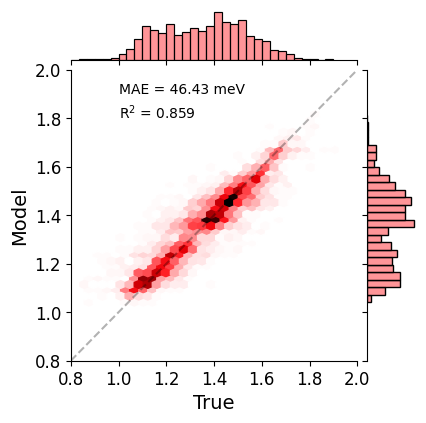

In [72]:
train_plot(train_true.ERed,train_graphNN.ERed,kind='hex')

The model predictions for the unseen testing set are computed below.

In [21]:
!chemprop_predict.exe --test_path .\MolRedPot-test.csv --checkpoint_dir .\chemprop_hyperopt\CV\ --preds_path CVpreds_test --uncertainty_method ensemble --individual_ensemble_predictions

Loading training args
Setting molecule featurization parameters to default.
Loading data
Validating SMILES
Test size = 1,089
Loading pretrained parameter "encoder.encoder.0.cached_zero_vector".
Loading pretrained parameter "encoder.encoder.0.W_i.weight".
Loading pretrained parameter "encoder.encoder.0.W_h.weight".
Loading pretrained parameter "encoder.encoder.0.W_o.weight".
Loading pretrained parameter "encoder.encoder.0.W_o.bias".
Loading pretrained parameter "ffn.1.weight".
Loading pretrained parameter "ffn.1.bias".
Loading pretrained parameter "ffn.4.weight".
Loading pretrained parameter "ffn.4.bias".
Moving model to cuda
Loading pretrained parameter "encoder.encoder.0.cached_zero_vector".
Loading pretrained parameter "encoder.encoder.0.W_i.weight".
Loading pretrained parameter "encoder.encoder.0.W_h.weight".
Loading pretrained parameter "encoder.encoder.0.W_o.weight".
Loading pretrained parameter "encoder.encoder.0.W_o.bias".
Loading pretrained parameter "ffn.1.weight".
Loading pre


0it [00:00, ?it/s]
1089it [00:00, ?it/s]

100%|##########| 1089/1089 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  5%|4         | 1/22 [00:32<11:22, 32.49s/it]

 23%|##2       | 5/22 [00:32<01:22,  4.86s/it]

 45%|####5     | 10/22 [00:32<00:23,  1.94s/it]

 95%|#########5| 21/22 [00:32<00:00,  1.48it/s]

                                               
  4%|4         | 1/25 [00:34<13:38, 34.10s/it]

  0%|          | 0/22 [00:00<?, ?it/s]

  5%|4         | 1/22 [00:28<09:54, 28.29s/it]

 23%|##2       | 5/22 [00:28<01:12,  4.24s/it]

 45%|####5     | 10/22 [00:28<00:20,  1.70s/it]

 73%|#######2  | 16/22 [00:28<00:05,  1.18it/s]

                                               
  8%|8         | 2/25 [01:03<12:05, 31.56s/it]

  0%|          | 0/22 [00:00<?, ?it/s]

  5%|4         | 1/22 [00:28<09:50, 28.11s/it]

 18%|#8        | 4/22 [00:28<01:36,  5.35s/it]

 41%|####      | 9/22 [00:28<00:23,  1.84s/it]

 64%|######3   | 14/22 [00:2

In [7]:
test_true=pd.read_csv('MolRedPot-test.csv',index_col=0)
test_true.head()

,ERed
SMILES,
CCOc1c2c(c(OC)c3nsnc13)N(C)CN2C,1.25
CCN1CCN(C)c2c1c(C(C)C)c1nsnc1c2C(C)C,1.27
CCOCCN1CCN(C)c2cc3nsnc3c(C)c21,1.41
CCCC1COc2c(cc3nsnc3c2N(C)C(C)CC)O1,1.72
C/C([O-])=[NH+]\c1c2c(c(C)c3nsnc13)N(CC(C)C)CN2C,1.24


In [8]:
test_graphNN=pd.read_csv('chemprop_hyperopt/CVpreds_test',index_col=0)
test_graphNN.head()

,ERed,ERed_ensemble_uncal_var
SMILES,,
CCOc1c2c(c(OC)c3nsnc13)N(C)CN2C,1.246075,0.000038
CCN1CCN(C)c2c1c(C(C)C)c1nsnc1c2C(C)C,1.353920,0.000051
CCOCCN1CCN(C)c2cc3nsnc3c(C)c21,1.280345,0.000044
CCCC1COc2c(cc3nsnc3c2N(C)C(C)CC)O1,1.438493,0.000088
C/C([O-])=[NH+]\c1c2c(c(C)c3nsnc13)N(CC(C)C)CN2C,1.235904,0.000046


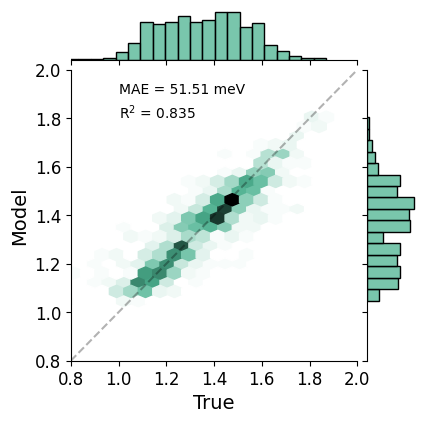

In [73]:
test_plot(test_true.ERed,test_graphNN.ERed,kind='hex')

#### Overall, the model perfomance is imroved compared to previous machine learning models. Their accuracy metrics evaluated over the testing dataset (MolRedPot-test.csv, 1089 molecules) is listed below.
<pre>
1. Linear Regression                 |     MAE = 65.47 meV
2. Gradient Boosting Regression      |     MAE = 56.38 meV 
3. Feed Forward Neural Network       |     MAE = 59.10 meV
4. Graph Neural NetworkL             |     MAE = 51.51 meV
</pre>

In [3]:
features_train=pd.read_csv('../DataScience/Data/features_train_scaled.csv')
target_train=pd.read_csv('../DataScience/Data/target_train.csv')['ERed']

features_test=pd.read_csv('../DataScience/Data/features_test_scaled.csv')
target_test=pd.read_csv('../DataScience/Data/target_test.csv')['ERed']

lr_model = pickle.load(open('../DataScience/Models/LinearRegression.sav', 'rb'))
train_linear=lr_model.predict(features_train)
test_linear=lr_model.predict(features_test)

gbr_model = pickle.load(open('../DataScience/Models/EnsembleGBR.sav', 'rb'))
train_gbr=gbr_model.predict(features_train)
test_gbr=gbr_model.predict(features_test)

NN_model = tf.keras.models.load_model('../DataScience/Models/NN_model_tuned/')
train_NN=NN_model.predict(features_train)
train_NN=train_NN.flatten()
test_NN=NN_model.predict(features_test)
test_NN=test_NN.flatten()

35/35 [==============================] - 0s 2ms/step


In [9]:
mae_linear_train=mean_absolute_error(train_linear,target_train)
mae_linear_test=mean_absolute_error(test_linear,target_test)

mae_gbr_train=mean_absolute_error(train_gbr,target_train)
mae_gbr_test=mean_absolute_error(test_gbr,target_test)

mae_nn_train=mean_absolute_error(train_NN,target_train)
mae_nn_test=mean_absolute_error(test_NN,target_test)

mae_gnn_train=mean_absolute_error(train_graphNN.ERed,train_true.ERed)
mae_gnn_test=mean_absolute_error(test_graphNN.ERed,test_true.ERed)

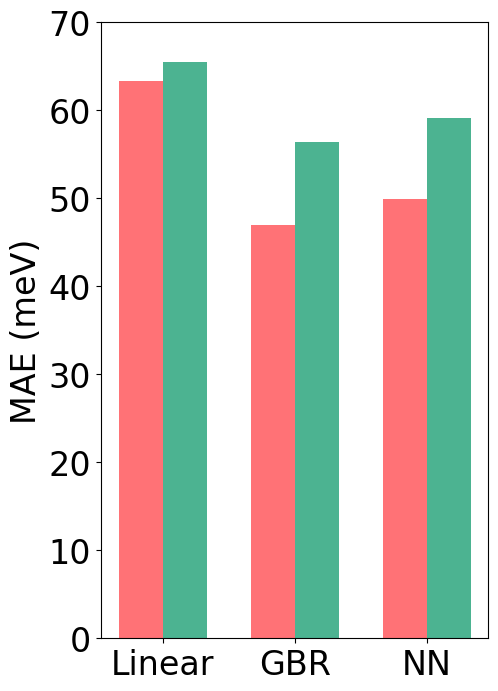

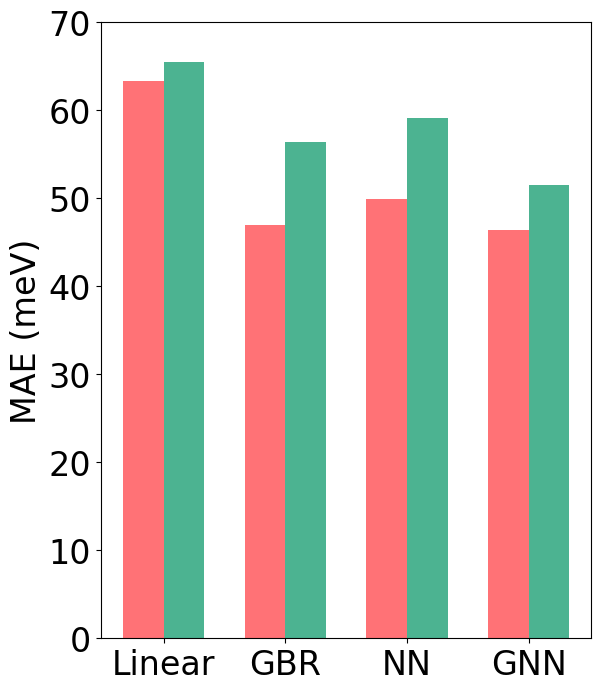

In [57]:
plt.figure(figsize=(5,8))
plt.bar([0,1,3,4,6,7],[mae_linear_train,mae_linear_test,mae_gbr_train,mae_gbr_test,mae_nn_train,mae_nn_test],color=['#FF7276','#4CB391'],width=1)
# plt.xticks([0,1,3,4,6,7,9,10],['Train','Test','Train','Test','Train','Test','Train','Test'],fontsize=14)
plt.xticks([0.5,3.5,6.5],['Linear','GBR','NN'],fontsize=24)
# plt.text(-0.5,mae_linear_train+0.001,'train',fontsize=18)
# plt.text(0.65,mae_linear_test+0.001,'test',fontsize=18)
plt.yticks([i/100 for i in range(8)],[10*i for i in range(8)],fontsize=24)
plt.ylim([0,0.07])
plt.ylabel('MAE (meV)',fontsize=24)
# plt.title('Training and testing error metrics',fontsize=14)
plt.show()

plt.figure(figsize=(6.33,8))
plt.bar([0,1,3,4,6,7,9,10],[mae_linear_train,mae_linear_test,mae_gbr_train,mae_gbr_test,mae_nn_train,mae_nn_test,mae_gnn_train,mae_gnn_test],color=['#FF7276','#4CB391'],width=1)
# plt.xticks([0,1,3,4,6,7,9,10],['Train','Test','Train','Test','Train','Test','Train','Test'],fontsize=14)
plt.xticks([0.5,3.5,6.5,9.5],['Linear','GBR','NN','GNN'],fontsize=24)
# plt.text(-0.5,mae_linear_train+0.001,'train',fontsize=18)
# plt.text(0.65,mae_linear_test+0.001,'test',fontsize=18)
plt.yticks([i/100 for i in range(8)],[10*i for i in range(8)],fontsize=24)
# plt.ylim([0,0.07])
plt.ylabel('MAE (meV)',fontsize=24)
# plt.title('Training and testing error metrics',fontsize=14)
plt.show()

In [44]:
r2_linear_train=r2_score(train_linear,target_train)
r2_linear_test=r2_score(test_linear,target_test)

r2_gbr_train=r2_score(train_gbr,target_train)
r2_gbr_test=r2_score(test_gbr,target_test)

r2_nn_train=r2_score(train_NN,target_train)
r2_nn_test=r2_score(test_NN,target_test)

r2_gnn_train=r2_score(train_graphNN.ERed,train_true.ERed)
r2_gnn_test=r2_score(test_graphNN.ERed,test_true.ERed)

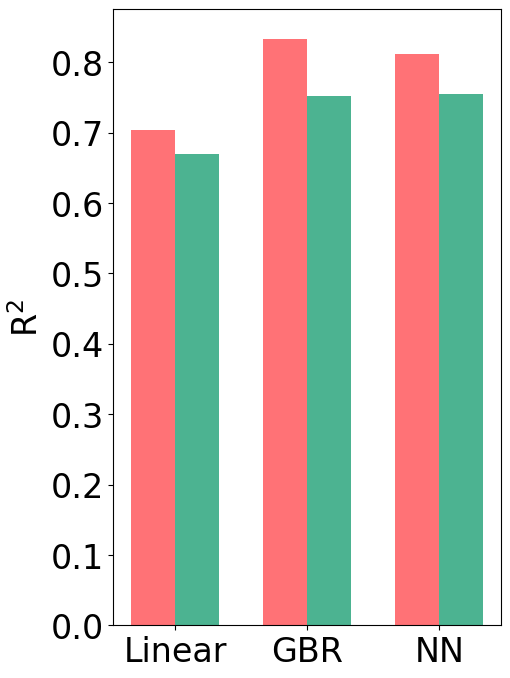

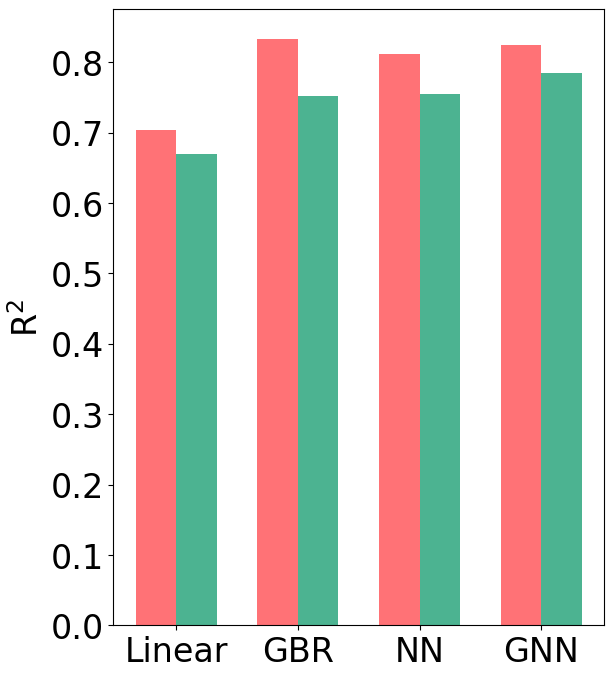

In [58]:
plt.figure(figsize=(5,8))
plt.bar([0,1,3,4,6,7],[r2_linear_train,r2_linear_test,r2_gbr_train,r2_gbr_test,r2_nn_train,r2_nn_test],color=['#FF7276','#4CB391'],width=1)
# plt.xticks([0,1,3,4,6,7,9,10],['Train','Test','Train','Test','Train','Test','Train','Test'],fontsize=14)
plt.xticks([0.5,3.5,6.5],['Linear','GBR','NN'],fontsize=24)
# plt.text(-0.5,mae_linear_train+0.001,'train',fontsize=18)
# plt.text(0.65,mae_linear_test+0.001,'test',fontsize=18)
plt.yticks(fontsize=24)
# plt.ylim([0,0.07])
plt.ylabel(r'R$^2$',fontsize=24)
# plt.title('Training and testing error metrics',fontsize=14)
plt.show()

plt.figure(figsize=(6.33,8))
plt.bar([0,1,3,4,6,7,9,10],[r2_linear_train,r2_linear_test,r2_gbr_train,r2_gbr_test,r2_nn_train,r2_nn_test,r2_gnn_train,r2_gnn_test],color=['#FF7276','#4CB391'],width=1)
# plt.xticks([0,1,3,4,6,7,9,10],['Train','Test','Train','Test','Train','Test','Train','Test'],fontsize=14)
plt.xticks([0.5,3.5,6.5,9.5],['Linear','GBR','NN','GNN'],fontsize=24)
# plt.text(-0.25,r2_linear_train+0.01,'train',fontsize=10)
# plt.text(0.75,r2_linear_test+0.01,'test',fontsize=10)
plt.yticks(fontsize=24)
# plt.ylim([0,0.07])
plt.ylabel('R$^2$',fontsize=24)
# plt.title('Training and testing error metrics',fontsize=14)
plt.show()